### Loading dataset

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import seaborn as sns
%matplotlib inline

In [3]:
df=pd.read_csv('US_Accidents_Dec21_updated.csv')
df

,ID,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-1,3,2016-02-08 00:37:08,2016-02-08 06:37:08,40.108910,-83.092860,40.112060,-83.031870,3.230,Between Sawmill Rd/Exit 20 and OH-315/Olentang...,...,False,False,False,False,False,False,Night,Night,Night,Night
1,A-2,2,2016-02-08 05:56:20,2016-02-08 11:56:20,39.865420,-84.062800,39.865010,-84.048730,0.747,At OH-4/OH-235/Exit 41 - Accident.,...,False,False,False,False,False,False,Night,Night,Night,Night
2,A-3,2,2016-02-08 06:15:39,2016-02-08 12:15:39,39.102660,-84.524680,39.102090,-84.523960,0.055,At I-71/US-50/Exit 1 - Accident.,...,False,False,False,False,False,False,Night,Night,Night,Day
3,A-4,2,2016-02-08 06:51:45,2016-02-08 12:51:45,41.062130,-81.537840,41.062170,-81.535470,0.123,At Dart Ave/Exit 21 - Accident.,...,False,False,False,False,False,False,Night,Night,Day,Day
4,A-5,3,2016-02-08 07:53:43,2016-02-08 13:53:43,39.172393,-84.492792,39.170476,-84.501798,0.500,At Mitchell Ave/Exit 6 - Accident.,...,False,False,False,False,False,False,Day,Day,Day,Day
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2845337,A-2845338,2,2019-08-23 18:03:25,2019-08-23 18:32:01,34.002480,-117.379360,33.998880,-117.370940,0.543,At Market St - Accident.,...,False,False,False,False,False,False,Day,Day,Day,Day
2845338,A-2845339,2,2019-08-23 19:11:30,2019-08-23 19:38:23,32.766960,-117.148060,32.765550,-117.153630,0.338,At Camino Del Rio/Mission Center Rd - Accident.,...,False,False,False,False,False,False,Day,Day,Day,Day
2845339,A-2845340,2,2019-08-23 19:00:21,2019-08-23 19:28:49,33.775450,-117.847790,33.777400,-117.857270,0.561,At Glassell St/Grand Ave - Accident. in the ri...,...,False,False,False,False,False,False,Day,Day,Day,Day
2845340,A-2845341,2,2019-08-23 19:00:21,2019-08-23 19:29:42,33.992460,-118.403020,33.983110,-118.395650,0.772,At CA-90/Marina Fwy/Jefferson Blvd - Accident.,...,False,False,False,False,False,False,Day,Day,Day,Day


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2845342 entries, 0 to 2845341
Data columns (total 47 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   ID                     object 
 1   Severity               int64  
 2   Start_Time             object 
 3   End_Time               object 
 4   Start_Lat              float64
 5   Start_Lng              float64
 6   End_Lat                float64
 7   End_Lng                float64
 8   Distance(mi)           float64
 9   Description            object 
 10  Number                 float64
 11  Street                 object 
 12  Side                   object 
 13  City                   object 
 14  County                 object 
 15  State                  object 
 16  Zipcode                object 
 17  Country                object 
 18  Timezone               object 
 19  Airport_Code           object 
 20  Weather_Timestamp      object 
 21  Temperature(F)         float64
 22  Wind_Chill(F)     

In [5]:
df.describe()

,Severity,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Number,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Precipitation(in)
count,2.845342e+06,2.845342e+06,2.845342e+06,2.845342e+06,2.845342e+06,2.845342e+06,1.101431e+06,2.776068e+06,2.375699e+06,2.772250e+06,2.786142e+06,2.774796e+06,2.687398e+06,2.295884e+06
mean,2.137572e+00,3.624520e+01,-9.711463e+01,3.624532e+01,-9.711439e+01,7.026779e-01,8.089408e+03,6.179356e+01,5.965823e+01,6.436545e+01,2.947234e+01,9.099391e+00,7.395044e+00,7.016940e-03
std,4.787216e-01,5.363797e+00,1.831782e+01,5.363873e+00,1.831763e+01,1.560361e+00,1.836009e+04,1.862263e+01,2.116097e+01,2.287457e+01,1.045286e+00,2.717546e+00,5.527454e+00,9.348831e-02
min,1.000000e+00,2.456603e+01,-1.245481e+02,2.456601e+01,-1.245457e+02,0.000000e+00,0.000000e+00,-8.900000e+01,-8.900000e+01,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,2.000000e+00,3.344517e+01,-1.180331e+02,3.344628e+01,-1.180333e+02,5.200000e-02,1.270000e+03,5.000000e+01,4.600000e+01,4.800000e+01,2.931000e+01,1.000000e+01,3.500000e+00,0.000000e+00
50%,2.000000e+00,3.609861e+01,-9.241808e+01,3.609799e+01,-9.241772e+01,2.440000e-01,4.007000e+03,6.400000e+01,6.300000e+01,6.700000e+01,2.982000e+01,1.000000e+01,7.000000e+00,0.000000e+00
75%,2.000000e+00,4.016024e+01,-8.037243e+01,4.016105e+01,-8.037338e+01,7.640000e-01,9.567000e+03,7.600000e+01,7.600000e+01,8.300000e+01,3.001000e+01,1.000000e+01,1.000000e+01,0.000000e+00
max,4.000000e+00,4.900058e+01,-6.711317e+01,4.907500e+01,-6.710924e+01,1.551860e+02,9.999997e+06,1.960000e+02,1.960000e+02,1.000000e+02,5.890000e+01,1.400000e+02,1.087000e+03,2.400000e+01


In [6]:
df.isnull().sum()

ID                             0
Severity                       0
Start_Time                     0
End_Time                       0
Start_Lat                      0
Start_Lng                      0
End_Lat                        0
End_Lng                        0
Distance(mi)                   0
Description                    0
Number                   1743911
Street                         2
Side                           0
City                         137
County                         0
State                          0
Zipcode                     1319
Country                        0
Timezone                    3659
Airport_Code                9549
Weather_Timestamp          50736
Temperature(F)             69274
Wind_Chill(F)             469643
Humidity(%)                73092
Pressure(in)               59200
Visibility(mi)             70546
Wind_Direction             73775
Wind_Speed(mph)           157944
Precipitation(in)         549458
Weather_Condition          70636
Amenity   

In [7]:
missing_values_percentage=((df.isna().sum().sort_values(ascending=False))/len(df))*100
missing_values_percentage

Number                   61.290031
Precipitation(in)        19.310789
Wind_Chill(F)            16.505678
Wind_Speed(mph)           5.550967
Wind_Direction            2.592834
Humidity(%)               2.568830
Weather_Condition         2.482514
Visibility(mi)            2.479350
Temperature(F)            2.434646
Pressure(in)              2.080593
Weather_Timestamp         1.783125
Airport_Code              0.335601
Timezone                  0.128596
Nautical_Twilight         0.100761
Civil_Twilight            0.100761
Sunrise_Sunset            0.100761
Astronomical_Twilight     0.100761
Zipcode                   0.046356
City                      0.004815
Street                    0.000070
Country                   0.000000
Junction                  0.000000
Start_Time                0.000000
End_Time                  0.000000
Start_Lat                 0.000000
Turning_Loop              0.000000
Traffic_Signal            0.000000
Traffic_Calming           0.000000
Stop                

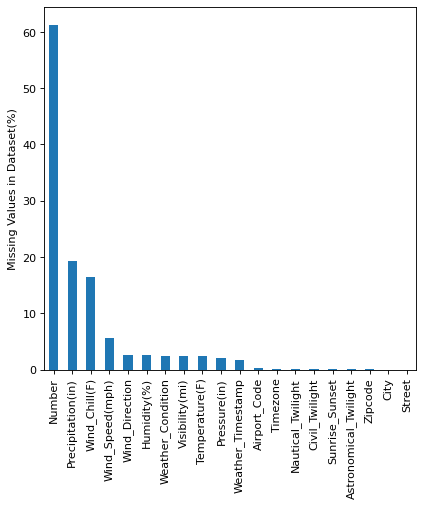

In [8]:
figure(figsize=(6,6), dpi=80)
missing_values_percentage[missing_values_percentage>0].plot(kind='bar')
plt.ylabel('Missing Values in Dataset(%)')
plt.show()

In [9]:
df.columns

Index(['ID', 'Severity', 'Start_Time', 'End_Time', 'Start_Lat', 'Start_Lng',
       'End_Lat', 'End_Lng', 'Distance(mi)', 'Description', 'Number', 'Street',
       'Side', 'City', 'County', 'State', 'Zipcode', 'Country', 'Timezone',
       'Airport_Code', 'Weather_Timestamp', 'Temperature(F)', 'Wind_Chill(F)',
       'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Direction',
       'Wind_Speed(mph)', 'Precipitation(in)', 'Weather_Condition', 'Amenity',
       'Bump', 'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway',
       'Roundabout', 'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal',
       'Turning_Loop', 'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight',
       'Astronomical_Twilight'],
      dtype='object')

### City 

In [10]:
len(df.City.unique())

11682

In [11]:
cities_by_accident=df.City.value_counts()
cities_by_accident[:15]

Miami          106966
Los Angeles     68956
Orlando         54691
Dallas          41979
Houston         39448
Charlotte       33152
Sacramento      32559
San Diego       26627
Raleigh         22840
Minneapolis     22768
Portland        20944
Nashville       20267
Austin          18301
Baton Rouge     18182
Phoenix         17143
Name: City, dtype: int64

In [12]:
'New York' in df.City        #This dataset does not contains info about New york which is the highest populated city in US

False

In [13]:
'New York' in df

False

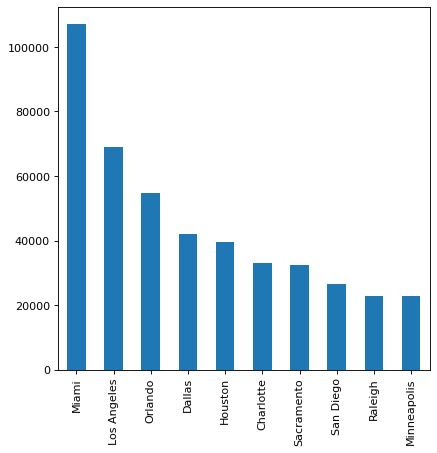

In [14]:
figure(figsize=(6,6), dpi=80)
cities_by_accident[:10].plot(kind='bar')
plt.show()

C:\Users\Jawwad\AppData\Roaming\Python\Python39\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='City', ylabel='Density'>

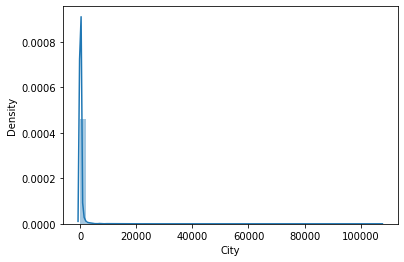

In [15]:
sns.distplot(cities_by_accident)

In [16]:
high_accident_city=cities_by_accident[cities_by_accident>=1000]
low_accident_city=cities_by_accident[cities_by_accident<1000]


In [17]:
one_accident_city_percentage=cities_by_accident[cities_by_accident==1]
one_accident_city_percentage
len(one_accident_city_percentage)    #Around 1110 cities report only 1 accident

1110

### Start Time

In [18]:
df.Start_Time[:20].value_counts()

2016-02-08 19:47:42    2
2016-02-08 18:11:11    2
2016-02-08 00:37:08    1
2016-02-08 05:56:20    1
2016-02-08 20:13:22    1
2016-02-08 17:30:18    1
2016-02-08 17:27:39    1
2016-02-08 16:50:57    1
2016-02-08 15:43:50    1
2016-02-08 15:16:43    1
2016-02-08 14:19:57    1
2016-02-08 11:51:46    1
2016-02-08 08:15:41    1
2016-02-08 08:16:57    1
2016-02-08 07:53:43    1
2016-02-08 06:51:45    1
2016-02-08 06:15:39    1
2016-02-08 21:00:17    1
Name: Start_Time, dtype: int64

In [19]:
df.Start_Time=pd.to_datetime(df.Start_Time)
df.Start_Time[:2]

0   2016-02-08 00:37:08
1   2016-02-08 05:56:20
Name: Start_Time, dtype: datetime64[ns]

<AxesSubplot:>

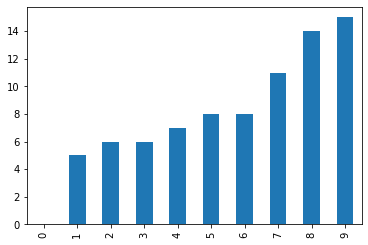

In [20]:
(df.Start_Time[:10].dt.hour).plot(kind='bar')

<AxesSubplot:xlabel='Start_Time', ylabel='Count'>

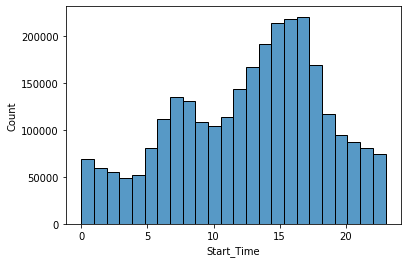

In [21]:
sns.histplot(df.Start_Time.dt.hour,bins=24)

C:\Users\Jawwad\AppData\Roaming\Python\Python39\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Start_Time'>

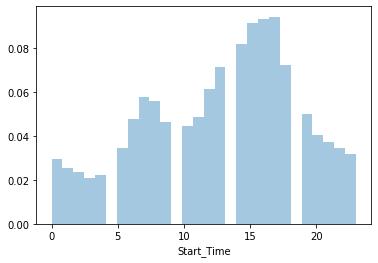

In [22]:
sns.distplot(df.Start_Time.dt.hour,bins=28,kde=False,norm_hist=True) 

<AxesSubplot:xlabel='Start_Time'>

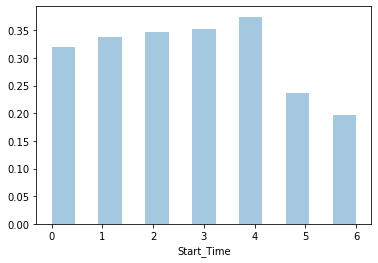

In [23]:
sns.distplot(df.Start_Time.dt.dayofweek,kde=False,norm_hist=True,bins=13)

<AxesSubplot:xlabel='Start_Time'>

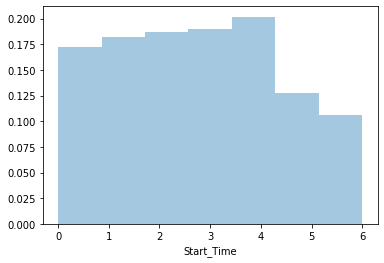

In [24]:
sns.distplot(df.Start_Time.dt.dayofweek,bins=7,kde=False,norm_hist=True)

<AxesSubplot:xlabel='Start_Time'>

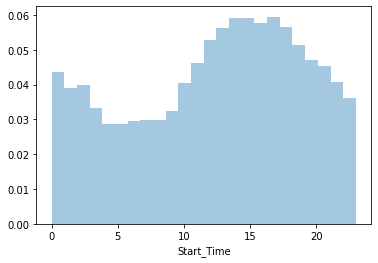

In [25]:
only_Sunday=df.Start_Time[df.Start_Time.dt.dayofweek == 6]
sns.distplot(only_Sunday.dt.hour,bins=24,kde=False,norm_hist=True)

<AxesSubplot:xlabel='Start_Time'>

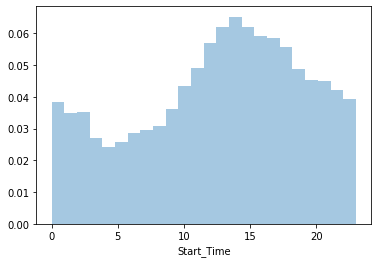

In [26]:
only_Saturday=df.Start_Time[df.Start_Time.dt.dayofweek == 5]
sns.distplot(only_Saturday.dt.hour,bins=24,kde=False,norm_hist=True)

<AxesSubplot:xlabel='Start_Time'>

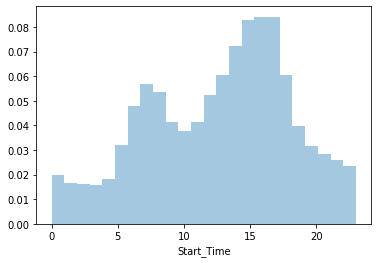

In [27]:
only_Monday=df.Start_Time[df.Start_Time.dt.dayofweek == 0]
sns.distplot(only_Monday.dt.hour,bins=24,kde=False,norm_hist=True)

<AxesSubplot:xlabel='Start_Time'>

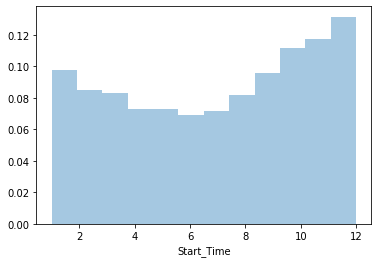

In [28]:
only_2018=df.Start_Time[df.Start_Time.dt.year == 2018]
sns.distplot(only_2018.dt.month,bins=12,kde=False,norm_hist=True)

### Start Latitude and Start Longitude

In [29]:
df.columns

Index(['ID', 'Severity', 'Start_Time', 'End_Time', 'Start_Lat', 'Start_Lng',
       'End_Lat', 'End_Lng', 'Distance(mi)', 'Description', 'Number', 'Street',
       'Side', 'City', 'County', 'State', 'Zipcode', 'Country', 'Timezone',
       'Airport_Code', 'Weather_Timestamp', 'Temperature(F)', 'Wind_Chill(F)',
       'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Direction',
       'Wind_Speed(mph)', 'Precipitation(in)', 'Weather_Condition', 'Amenity',
       'Bump', 'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway',
       'Roundabout', 'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal',
       'Turning_Loop', 'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight',
       'Astronomical_Twilight'],
      dtype='object')

In [30]:
df.Start_Lat[:10]

0    40.108910
1    39.865420
2    39.102660
3    41.062130
4    39.172393
5    39.063240
6    39.775650
7    41.375310
8    40.702247
9    40.109310
Name: Start_Lat, dtype: float64

In [31]:
df.Start_Lng[:10]

0   -83.092860
1   -84.062800
2   -84.524680
3   -81.537840
4   -84.492792
5   -84.032430
6   -84.186030
7   -81.820170
8   -84.075887
9   -82.968490
Name: Start_Lng, dtype: float64

<AxesSubplot:xlabel='Start_Lng', ylabel='Start_Lat'>

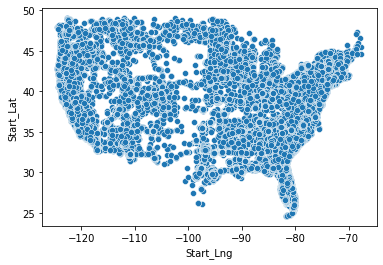

In [32]:
ten_percent_sample=df.sample(int(0.1*len(df)))
ten_percent_sample
sns.scatterplot(x=ten_percent_sample.Start_Lng,y=ten_percent_sample.Start_Lat)

In [33]:
import folium

In [34]:
map=folium.Map()
lat,lon=df.Start_Lat[:5],df.Start_Lng[:5]
#lat,lon
marker=folium.Marker((lat[2],lon[2]))
marker.add_to(map)
map
#folium.Map()

In [39]:
from folium import plugins
from folium.plugins import HeatMap

In [40]:
lat_lon_in_list_form=list(zip(list(ten_percent_sample.Start_Lat),list(ten_percent_sample.Start_Lng)))
lat_lon_in_list_form

[(36.139944, -86.80044699999998),
 (39.112728, -121.082397),
 (39.910639, -76.634976),
 (33.975346, -117.879411),
 (38.89011, -112.416239),
 (28.481623, -81.330857),
 (41.026265, -76.423071),
 (37.74135, -121.580823),
 (47.30271, -122.2559),
 (32.04371, -81.06914),
 (42.400624, -122.186221),
 (36.806636, -79.938338),
 (27.037219, -82.397958),
 (33.970026000000004, -117.375527),
 (35.028566999999995, -85.309494),
 (35.29223599999999, -119.029392),
 (40.449571, -74.423266),
 (45.432398, -122.372485),
 (43.024801, -85.689141),
 (34.031896, -118.417066),
 (30.41673, -91.08898),
 (35.11521, -80.96233000000002),
 (39.796931, -74.37639200000002),
 (38.777152, -77.59798),
 (34.135372, -118.005125),
 (39.123021, -122.857182),
 (44.953912, -93.072607),
 (39.93171, -82.92666),
 (32.509742, -92.235763),
 (28.421363, -81.402794),
 (33.928379, -118.288911),
 (41.376711, -73.983145),
 (34.45261, -118.61513),
 (44.32076, -93.960199),
 (38.604981, -121.400163),
 (34.022716, -117.555482),
 (34.05227, -1

In [37]:
map=folium.Map()
HeatMap(lat_lon_in_list_form).add_to(map)
map

In [42]:
df.City

0               Dublin
1               Dayton
2           Cincinnati
3                Akron
4           Cincinnati
              ...     
2845337      Riverside
2845338      San Diego
2845339         Orange
2845340    Culver City
2845341       Highland
Name: City, Length: 2845342, dtype: object

### Insights and Conclusion:
### . 3 major columns are analyzed which are: City , Start_Time and Start_Lat,Start_Lng
### . There is no data available for New York which is one of the highest populated City in the US.
### . Mostly accidents occured during weekdays and the time of majority of the accidents is in the evening.
### . Around 1110 cities report only 1 accident